In [93]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [94]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
import datetime
import math
import calendar
from math import radians
from sklearn.metrics import classification_report, plot_roc_curve
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.feature_selection import RFE
import statsmodels.api as sm

# `Reading and Understanding the Data`

In [95]:
df = pd.read_csv('/content/gdrive/MyDrive/Credit Card Fraud Detection Dataset/fraudTrain.csv')
df.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,...,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,...,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,...,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,...,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,...,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,...,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [96]:
# Let us check if there are null values in the dataset

df.isnull().sum()

Unnamed: 0               0
trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

In [97]:
# Including only relevant columns/features in a new dataframe

fraud_train = df[['trans_date_trans_time','amt','gender','lat','long','city_pop','dob','merch_lat','merch_long','is_fraud']]
fraud_train.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,4.97,F,36.0788,-81.1781,3495,1988-03-09,36.011293,-82.048315,0
1,2019-01-01 00:00:44,107.23,F,48.8878,-118.2105,149,1978-06-21,49.159047,-118.186462,0
2,2019-01-01 00:00:51,220.11,M,42.1808,-112.2620,4154,1962-01-19,43.150704,-112.154481,0
3,2019-01-01 00:01:16,45.00,M,46.2306,-112.1138,1939,1967-01-12,47.034331,-112.561071,0
4,2019-01-01 00:03:06,41.96,M,38.4207,-79.4629,99,1986-03-28,38.674999,-78.632459,0


> - #### Identifying Target Variable - is_fraud

In [98]:
# Converting columns to datetime for fraud_train

fraud_train.dob = pd.to_datetime(fraud_train['dob'])
fraud_train.trans_date_trans_time = pd.to_datetime(fraud_train['trans_date_trans_time'])

In [99]:
# Creating column for transaction date and converting into datetime

fraud_train['Transaction_Date'] = pd.to_datetime(fraud_train['trans_date_trans_time'], format='%Y:%M:%D').dt.date
fraud_train.Transaction_Date = pd.to_datetime(fraud_train['Transaction_Date'])

In [100]:
# Creating column for transaction time

fraud_train['Transaction_Time'] = pd.to_datetime(fraud_train['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [101]:
# Creating column for Age

fraud_train['Age'] = round((fraud_train['Transaction_Date'] - fraud_train['dob'])/np.timedelta64(1, 'Y'))
fraud_train.Age = fraud_train.Age.astype('int')

In [102]:
fraud_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 13 columns):
 #   Column                 Non-Null Count    Dtype         
---  ------                 --------------    -----         
 0   trans_date_trans_time  1296675 non-null  datetime64[ns]
 1   amt                    1296675 non-null  float64       
 2   gender                 1296675 non-null  object        
 3   lat                    1296675 non-null  float64       
 4   long                   1296675 non-null  float64       
 5   city_pop               1296675 non-null  int64         
 6   dob                    1296675 non-null  datetime64[ns]
 7   merch_lat              1296675 non-null  float64       
 8   merch_long             1296675 non-null  float64       
 9   is_fraud               1296675 non-null  int64         
 10  Transaction_Date       1296675 non-null  datetime64[ns]
 11  Transaction_Time       1296675 non-null  object        
 12  Age                    12966

In [103]:
# Creating a function to calculate the Day of Week

def DoW(x):
    day = datetime.datetime.weekday(x)
    return (calendar.day_name[day])

fraud_train['Day_of_Week'] = fraud_train['Transaction_Date'].apply(DoW)

In [105]:
# # Creating a new column Month 

fraud_train['Month'] = pd.DatetimeIndex(fraud_train.trans_date_trans_time).month

# Making Gender column binary

fraud_train['gender'] = fraud_train['gender'].map({'F':1, 'M':0})
fraud_train['Day_of_Week'] = fraud_train['Day_of_Week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,
                                                          'Friday':5, 'Saturday':6, 'Sunday': 7})

In [106]:
# Creating a function to calculate the distance between customer's base location and merchant location

def haversineDistance(lat1,lon1,lat2,lon2):
    Lat_Dist = radians(lat2 - lat1)
    Long_Dist = radians(lon2 - lon1)

    ans = (pow(math.sin(Lat_Dist / 2), 2) + pow(math.sin(Long_Dist / 2), 2) * math.cos(lat1) * math.cos(lat2));
    radius = 6371
    cal = 2 * math.asin(math.sqrt(ans))
    return radius * cal

Dist = []
for a,b,c,d in zip(fraud_train['lat'], fraud_train['long'], fraud_train['merch_lat'], fraud_train['merch_long']):
    Dist.append(haversineDistance(a,b,c,d))
    
fraud_train['Dist'] = Dist
fraud_train.head()

,trans_date_trans_time,amt,gender,lat,long,city_pop,dob,merch_lat,merch_long,is_fraud,Transaction_Date,Transaction_Time,Age,Day_of_Week,Month,Dist
0,2019-01-01 00:00:18,4.97,NaN,36.0788,-81.1781,3495,1988-03-09,36.011293,-82.048315,0,2019-01-01,00:00:18,31,NaN,1,10.509708
1,2019-01-01 00:00:44,107.23,NaN,48.8878,-118.2105,149,1978-06-21,49.159047,-118.186462,0,2019-01-01,00:00:44,41,NaN,1,30.171468
2,2019-01-01 00:00:51,220.11,NaN,42.1808,-112.2620,4154,1962-01-19,43.150704,-112.154481,0,2019-01-01,00:00:51,57,NaN,1,107.746268
3,2019-01-01 00:01:16,45.00,NaN,46.2306,-112.1138,1939,1967-01-12,47.034331,-112.561071,0,2019-01-01,00:01:16,52,NaN,1,97.629363
4,2019-01-01 00:03:06,41.96,NaN,38.4207,-79.4629,99,1986-03-28,38.674999,-78.632459,0,2019-01-01,00:03:06,33,NaN,1,66.236025


In [107]:
# Dropping unnecessay columns

fraud_train.drop(['trans_date_trans_time','Transaction_Date','Transaction_Time','dob', 
                 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
fraud_train.head()

,amt,gender,city_pop,is_fraud,Age,Day_of_Week,Month,Dist
0,4.97,NaN,3495,0,31,NaN,1,10.509708
1,107.23,NaN,149,0,41,NaN,1,30.171468
2,220.11,NaN,4154,0,57,NaN,1,107.746268
3,45.00,NaN,1939,0,52,NaN,1,97.629363
4,41.96,NaN,99,0,33,NaN,1,66.236025


# `Exploratory Data Analysis`

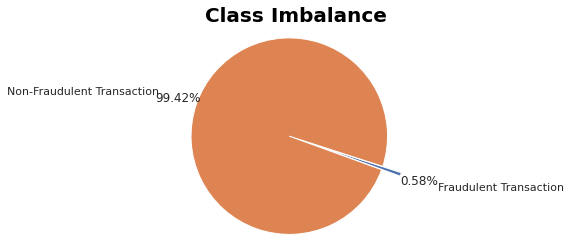

In [111]:
# first, let us check on class imbalance
frd=df['is_fraud'].value_counts()
frd

fraud= frd[1]/df['is_fraud'].count()*100
nfraud= frd[0]/df['is_fraud'].count()*100

label = ['Fraudulent Transaction','Non-Fraudulent Transaction']
values = [fraud, nfraud]
explode = (0.2, 0)
fig1, ax1 = plt.subplots()
ax1.pie(values,labels=label, explode=explode,autopct='%0.2f%%',shadow=False, startangle=340, pctdistance=1.2,labeldistance=1.4)
ax1.axis('equal') 
plt.title('Class Imbalance',fontsize=20, color='black', fontweight='bold')
plt.show()

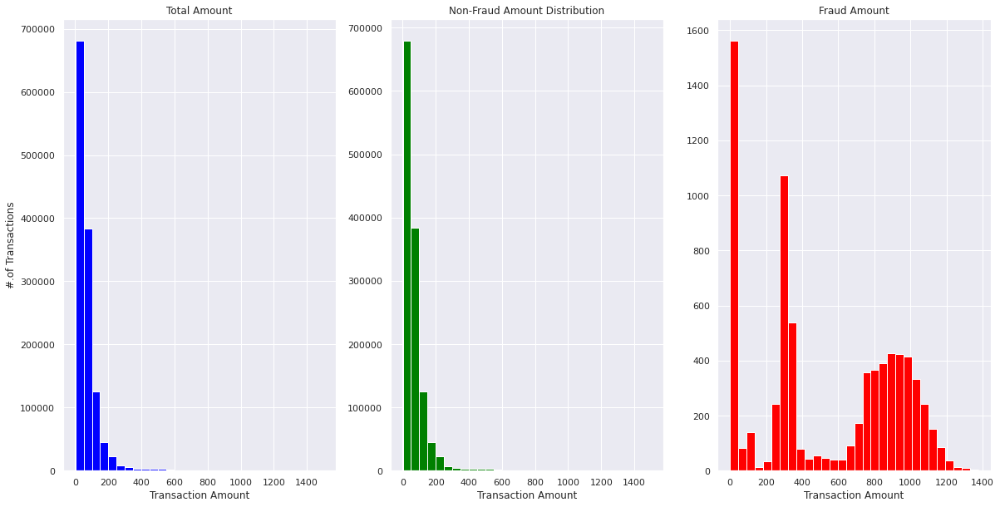

In [123]:
#distribution of transactions amount by different fraudulent  and non-fraudulent categories

fig, ax = plt.subplots(1,3,figsize=(20,10))
ax[0].hist(df[df['amt']<=1500]['amt'], bins=30,color='blue')
ax[0].set_title('Total Amount')
ax[0].set_xlabel('Transaction Amount')
ax[0].set_ylabel('#.of Transactions')

ax[1].hist(df[(df['is_fraud']==0) & (df['amt']<=1500)]['amt'], bins=30,color='green')
ax[1].set_title('Non-Fraud Amount Distribution')
ax[1].set_xlabel('Transaction Amount')

ax[2].hist(df[(df['is_fraud']==1) & (df['amt']<=1500)]['amt'], bins=30,color='red')
ax[2].set_title('Fraud Amount')
ax[2].set_xlabel('Transaction Amount')

plt.show()

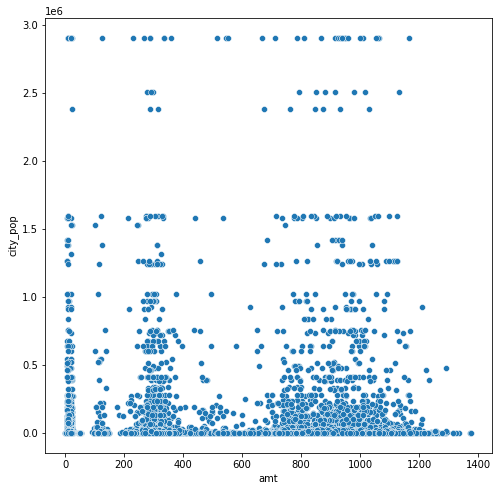

In [15]:
plt.figure(figsize = (8,8))
sns.scatterplot(data = fraud_train[fraud_train['is_fraud'] == 1], x = 'amt', y = 'city_pop')
plt.show()

- No clear relation between city population and the amount of spending

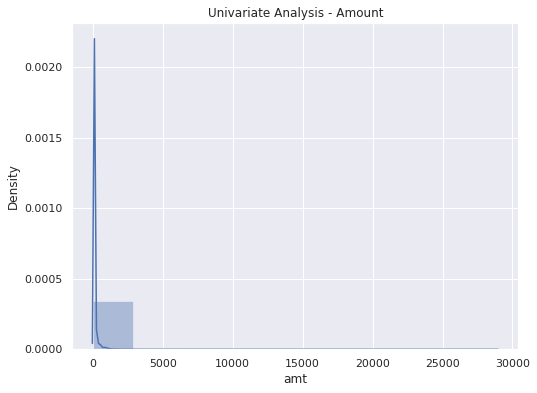

In [16]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraud_train['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- As the kernel density function clearly shows major skewness, treating the variable amt with log transformations

In [17]:
fraud_train['amt'] = np.log(fraud_train['amt'])

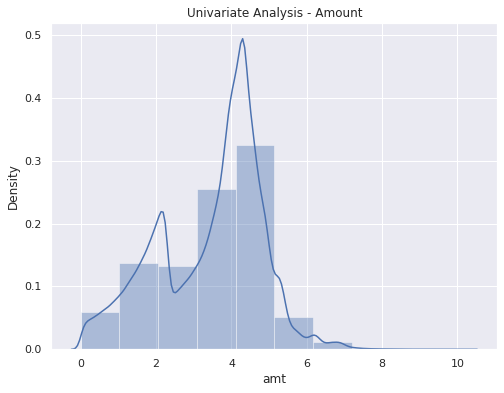

In [18]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraud_train['amt'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- Skewness is treated

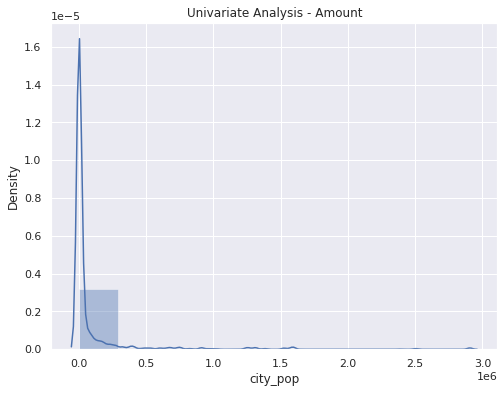

In [19]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraud_train['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- As the kernel density function clearly shows major skewness, treating the variable city_pop with log transformations

In [20]:
fraud_train['city_pop'] = np.log(fraud_train['city_pop'])

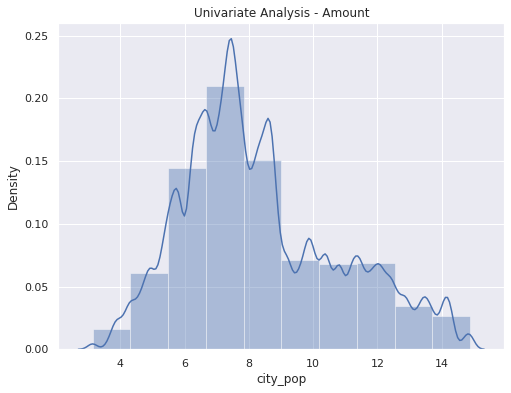

In [21]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraud_train['city_pop'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

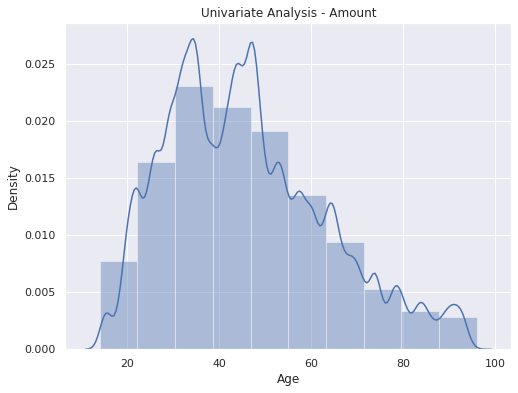

In [22]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraud_train['Age'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

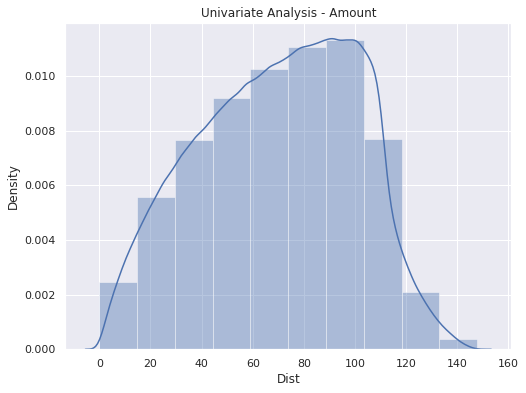

In [23]:
plt.figure(figsize = [8,6])
sns.set_theme()
sns.distplot(fraud_train['Dist'], bins = 10, kde = True)
plt.title('Univariate Analysis - Amount')
plt.show()

- No major skewness found in Distance and Age variables

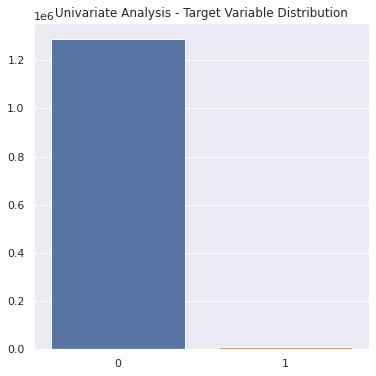

In [24]:
# Let us see the Target Variable distribution across the dataset

x = [0, 1]
y = [fraud_train.is_fraud.value_counts()[0],fraud_train.is_fraud.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Target Variable Distribution')
plt.show()

- The data shows clear imbalance in the target variable which needs to be handled by sampling methods

Text(0.5, 1.0, 'Univariate Analysis - Gender Distribution')

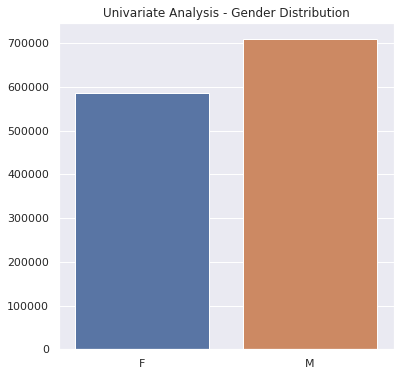

In [25]:
# Let us see the Gender distribution across the dataset

x = ['F', 'M']
y = [fraud_train.gender.value_counts()[0], fraud_train.gender.value_counts()[1]]

plt.figure(figsize = [6,6])
ax = sns.barplot(x = x, y = y)
plt.title('Univariate Analysis - Gender Distribution')

# `Train/Test Data Splitting`

In [26]:
y = fraud_train.pop('is_fraud')
X = fraud_train

In [27]:
from sklearn import model_selection

# To handle data imbalance while splitting, using the stratify method

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, stratify = y, random_state=42)

In [28]:
#Confirming shapes of the test and train datasets

X_train.shape, X_test.shape

((972506, 7), (324169, 7))

## Scaling of variables for Logistic Regression

In [29]:
fraud_train.columns

Index(['amt', 'gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist'], dtype='object')

In [30]:
# Making a copy of the X_train and scaling it as that is specific only to Logistic Regression

X_train_lr = X_train.copy()

scaler = MinMaxScaler()
X_train_lr[['amt', 'gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist']] = scaler.fit_transform(X_train[['amt','gender', 'city_pop', 'Age', 'Day_of_Week', 'Month', 'Dist']])
X_train_lr.head()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
267436,0.482372,0.0,0.448670,0.353659,1.000000,0.363636,0.376031
233159,0.251400,1.0,0.230283,0.463415,0.833333,0.272727,0.642221
430072,0.441626,0.0,0.470635,0.560976,0.666667,0.545455,0.718947
236662,0.474693,1.0,0.698418,0.414634,1.000000,0.272727,0.510120
450357,0.462170,0.0,0.477590,0.841463,0.666667,0.545455,0.540952


In [31]:
# Confirming if scaling has worked

X_train_lr.describe()

,amt,gender,city_pop,Age,Day_of_Week,Month,Dist
count,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000,972506.000000
mean,0.338391,0.546699,0.444523,0.390205,0.511807,0.467545,0.473872
std,0.135778,0.497815,0.208761,0.212136,0.366377,0.310577,0.206361
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.221962,0.000000,0.295607,0.231707,0.166667,0.181818,0.314929
50%,0.377921,1.000000,0.397163,0.365854,0.500000,0.454545,0.488222
75%,0.432530,1.000000,0.577530,0.524390,0.833333,0.727273,0.640732
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


# `Model Building and Hyperparameter Tuning`

> The algorithms that will be used in order to create classification models that would be sensitive to detecting fraudulent transactions are:
- Logistic Regression
- Decision Trees
- Random Forest
- XGBoost

> Each algorithm will have an unsampled model and will then be compared by using sampling methods - SMOTE and ADASYN
> Let us proceed with the model building part in the order mentioned above:

## 1.1 Logistic Regression - Unsampled

In [32]:
logreg_unsampled = LogisticRegression().fit(X_train_lr,y_train)

#### Hyperparameter tuning using Grid Search CV

In [33]:
from sklearn.model_selection import GridSearchCV

In [34]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_1 = GridSearchCV(estimator=logreg_unsampled,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [35]:
%%time
grid_search_1.fit(X_train_lr, y_train)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 2.95 s, sys: 2.3 s, total: 5.25 s
Wall time: 56.2 s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [36]:
grid_search_1.best_score_

0.0

# `Model Evaluation` 
> The metric used to evaluate the models is - Recall
- Recall attempts to answer the following question: What proportion of actual positives was identified correctly?
- Mathematically, recall is defined as:

![image.png](attachment:image.png)

In [37]:
def evaluate_model_lr_unsampled(classifier):
    y_train_pred = classifier.predict(X_train_lr)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(metrics.recall_score(y_train, y_train_pred))
    print(metrics.confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [38]:
lr_unsampled = grid_search_1.best_estimator_
evaluate_model_lr_unsampled(lr_unsampled)

Train set performance:
0.0
[[966877      0]
 [  5629      0]]
-------------------------
Test set performance:
0.9952051145444859
[[  9693 312599]
 [     9   1868]]


#### ROC Curve

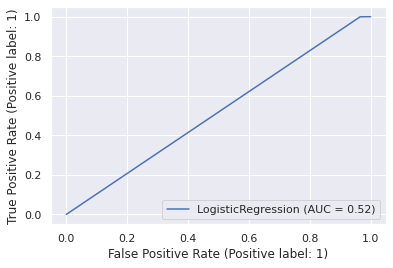

In [39]:
metrics.plot_roc_curve(logreg_unsampled, X_test, y_test)

> #### Metrics for Logistic Regression - Unsampled: 
- Recall on Train: 0.0
- Recall on Test: 0.99
- Area Under the Curve: 0.52

## Let us try out two sampling methods - SMOTE and ADASYN

In [40]:
from imblearn.over_sampling import SMOTE, ADASYN
X_train_smote_lr, y_train_smote_lr = SMOTE().fit_resample(X_train_lr, y_train)
X_train_adasyn_lr, y_train_adasyn_lr = ADASYN().fit_resample(X_train_lr, y_train)

## 1.2 Logistic Regression with SMOTE

In [41]:
logreg_smote = LogisticRegression().fit(X_train_smote_lr,y_train_smote_lr)

In [42]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_2 = GridSearchCV(estimator=logreg_smote,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [43]:
%%time
grid_search_2.fit(X_train_smote_lr, y_train_smote_lr)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 5.43 s, sys: 2.44 s, total: 7.87 s
Wall time: 1min 41s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [44]:
grid_search_2.best_score_

0.7790515242304104

In [45]:
def evaluate_model_lr_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote_lr)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(metrics.recall_score(y_train_smote_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_smote_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [46]:
lr_smote = grid_search_2.best_estimator_
evaluate_model_lr_smote(lr_smote)

Train set performance:
0.7790566949053499
[[777143 189734]
 [213625 753252]]
-------------------------
Test set performance:
1.0
[[     0 322292]
 [     0   1877]]


#### ROC Curve

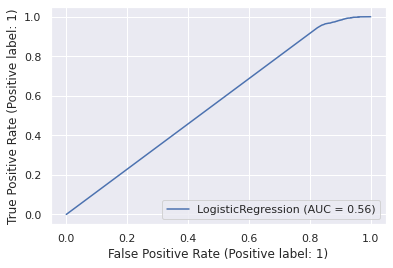

In [47]:
metrics.plot_roc_curve(logreg_smote, X_test, y_test)

> #### Metrics for Logistic Regression - SMOTE: 
- Recall on Train: 0.77
- Recall on Test: 1.0
- Area Under the Curve: 0.56

## 1.3 Logistic Regression with ADASYN

In [48]:
logreg_adasyn = LogisticRegression().fit(X_train_adasyn_lr,y_train_adasyn_lr)

In [49]:
params_lr = {
    'C': np.logspace(-3,3,7),
    'penalty': ['l2']
}

grid_search_3 = GridSearchCV(estimator=logreg_adasyn,
                    param_grid=params_lr,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [50]:
%%time
grid_search_3.fit(X_train_adasyn_lr, y_train_adasyn_lr)

Fitting 5 folds for each of 7 candidates, totalling 35 fits
CPU times: user 5.73 s, sys: 2.53 s, total: 8.26 s
Wall time: 1min 31s


GridSearchCV(cv=5, estimator=LogisticRegression(), n_jobs=-1,
             param_grid={'C': array([1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01, 1.e+02, 1.e+03]),
                         'penalty': ['l2']},
             scoring='recall', verbose=1)

In [51]:
grid_search_3.best_score_

0.7314189643577673

In [52]:
def evaluate_model_lr_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn_lr)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(metrics.recall_score(y_train_adasyn_lr, y_train_pred))
    print(metrics.confusion_matrix(y_train_adasyn_lr, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(metrics.recall_score(y_test, y_test_pred))
    print(metrics.confusion_matrix(y_test, y_test_pred))

In [53]:
lr_adasyn = grid_search_3.best_estimator_
evaluate_model_lr_adasyn(lr_adasyn)

Train set performance:
0.7314293104340179
[[724888 241989]
 [259587 706963]]
-------------------------
Test set performance:
1.0
[[     8 322284]
 [     0   1877]]


#### ROC Curve

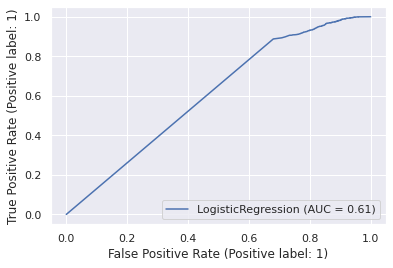

In [54]:
metrics.plot_roc_curve(logreg_adasyn, X_test, y_test)

> #### Metrics for Logistic Regression - ADASYN: 
- Recall on Train: 0.73
- Recall on Test: 1.0
- Area Under the Curve: 0.60

-----------------------------

# 2.1 Decision Tree Classifier - Unsampled

In [55]:
from sklearn.tree import DecisionTreeClassifier
from IPython.display import Image
from six import StringIO
from sklearn.tree import export_graphviz
import pydotplus, graphviz
from sklearn.metrics import confusion_matrix, accuracy_score, recall_score

### Creating Helper Functions

In [56]:
def get_graph(classifier):
    dot_data = StringIO()
    
    export_graphviz(classifier, out_file = dot_data, filled = True, rounded = True,
               feature_names=X.columns,
               class_names=['No Fraud', 'Fraud'])
    graph = pydotplus.graph_from_dot_data(dot_data.getvalue())
    return graph

In [57]:
def evaluate_model_unsampled(classifier):
    y_train_pred = classifier.predict(X_train)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(recall_score(y_train, y_train_pred))
    print(confusion_matrix(y_train, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

### Hyper-parameter tuning using Grid Search CV

In [58]:
dt_unsampled = DecisionTreeClassifier(random_state=42).fit(X_train,y_train)

#### After various trial and error methods, fixing hyper-parameters to:

In [59]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_4 = GridSearchCV(estimator=dt_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [60]:
%%time
grid_search_4.fit(X_train, y_train)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 7.75 s, sys: 1.67 s, total: 9.42 s
Wall time: 5min 12s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [61]:
grid_search_4.best_score_

0.33167744227353463

In [62]:
dt_best = grid_search_4.best_estimator_
evaluate_model_unsampled(dt_best)

Train set performance:
0.30982412506661927
[[966063    814]
 [  3885   1744]]
-------------------------
Test set performance:
0.2855620671283964
[[321988    304]
 [  1341    536]]


In [63]:
grid_search_4.best_params_

{'criterion': 'gini', 'max_depth': 7, 'min_samples_leaf': 80}

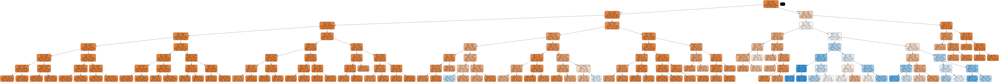

In [64]:
gph = get_graph(dt_best)
Image(gph.create_png())

#### ROC Curve

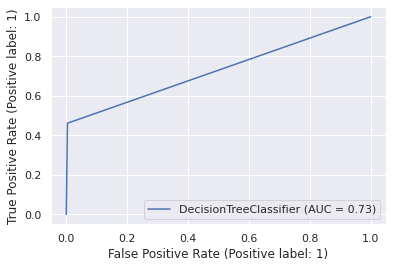

In [65]:
metrics.plot_roc_curve(dt_unsampled, X_test, y_test)

> #### Metrics for Decision Trees - Unsampled: 
- Recall on Train: 0.30
- Recall on Test: 0.28
- Area Under the Curve: 0.73

## 2.2 Decision Tree with SMOTE

In [66]:
X_train_smote, y_train_smote = SMOTE().fit_resample(X_train, y_train)

In [67]:
dt_smote = DecisionTreeClassifier(random_state=42).fit(X_train_smote,y_train_smote)

### Creating Helper Functions

In [68]:
def evaluate_model_smote(classifier):
    y_train_pred = classifier.predict(X_train_smote)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(recall_score(y_train_smote, y_train_pred))
    print(confusion_matrix(y_train_smote, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

In [69]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_5 = GridSearchCV(estimator=dt_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [70]:
%%time
grid_search_5.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 23.1 s, sys: 845 ms, total: 23.9 s
Wall time: 12min 58s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [71]:
grid_search_5.best_score_

0.8580905285338719

In [72]:
dt_smote = grid_search_5.best_estimator_
evaluate_model_smote(dt_smote)

Train set performance:
0.8607682259480782
[[888853  78024]
 [134620 832257]]
-------------------------
Test set performance:
0.8263185935002664
[[296133  26159]
 [   326   1551]]


In [73]:
grid_search_5.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 50}

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.327065 to fit



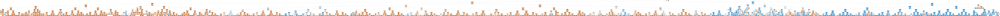

In [74]:
gph = get_graph(dt_smote)
Image(gph.create_png())

#### ROC Curve

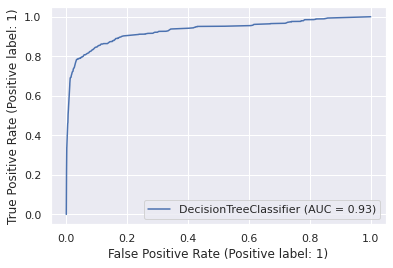

In [75]:
metrics.plot_roc_curve(dt_smote, X_test, y_test)

> #### Metrics for Decision Trees - SMOTE: 
- Recall on Train: 0.85
- Recall on Test: 0.82
- Area Under the Curve: 0.93

## 2.3 Decision Tree with ADASYN

In [76]:
X_train_adasyn, y_train_adasyn = ADASYN().fit_resample(X_train, y_train)

### Creating Helper Functions

In [77]:
def evaluate_model_adasyn(classifier):
    y_train_pred = classifier.predict(X_train_adasyn)
    y_test_pred = classifier.predict(X_test)
    
    print('Train set performance:')
    print(recall_score(y_train_adasyn, y_train_pred))
    print(confusion_matrix(y_train_adasyn, y_train_pred))
    print("-"*25)
    print('Test set performance:')
    print(recall_score(y_test, y_test_pred))
    print(confusion_matrix(y_test, y_test_pred))

In [78]:
dt_adasyn = DecisionTreeClassifier(random_state=42).fit(X_train_adasyn,y_train_adasyn)

In [79]:
params = {
    'max_depth': [3,5,7,9,10],
    'min_samples_leaf': [50,60,70,80,110],
    'criterion': ['gini']
}

grid_search_6 = GridSearchCV(estimator=dt_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [80]:
%%time
grid_search_6.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 25 candidates, totalling 125 fits
CPU times: user 21.5 s, sys: 800 ms, total: 22.3 s
Wall time: 11min 36s


GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [3, 5, 7, 9, 10],
                         'min_samples_leaf': [50, 60, 70, 80, 110]},
             scoring='recall', verbose=1)

In [81]:
grid_search_6.best_score_

0.8472162717812022

In [82]:
dt_adasyn = grid_search_6.best_estimator_
evaluate_model_adasyn(dt_adasyn)

Train set performance:
0.8508847854860724
[[889128  77749]
 [144542 824789]]
-------------------------
Test set performance:
0.8257858284496538
[[296212  26080]
 [   327   1550]]


In [83]:
grid_search_6.best_params_

{'criterion': 'gini', 'max_depth': 10, 'min_samples_leaf': 60}

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.350288 to fit



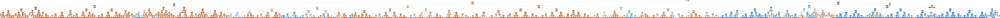

In [84]:
gph = get_graph(dt_adasyn)
Image(gph.create_png())

#### ROC Curve

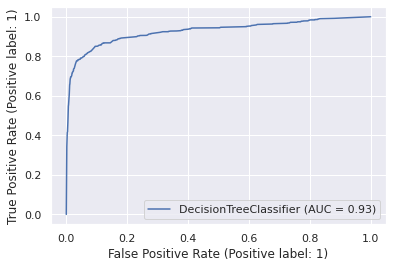

In [85]:
metrics.plot_roc_curve(dt_adasyn, X_test, y_test)

> #### Metrics for Decision Trees - ADASYN: 
- Recall on Train: 0.85
- Recall on Test: 0.82
- Area Under the Curve: 0.93

---------------

# 3.1 Random Forest - Unsampled

In [86]:
from sklearn.ensemble import RandomForestClassifier

In [87]:
rf_unsampled = RandomForestClassifier(random_state=42).fit(X_train, y_train)

#### After various trial and error methods, fixing hyper-parameters to:

In [124]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:


params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_7 = GridSearchCV(estimator=rf_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [125]:
%%time
grid_search_7.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 34 s, sys: 1.37 s, total: 35.3 s
Wall time: 16min 20s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [126]:
rf_best = grid_search_7.best_estimator_
evaluate_model_unsampled(rf_best)

Train set performance:
0.22632794457274827
[[966547    330]
 [  4355   1274]]
-------------------------
Test set performance:
0.19659030367607885
[[322157    135]
 [  1508    369]]


In [127]:
grid_search_7.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 15}

#### ROC Curve

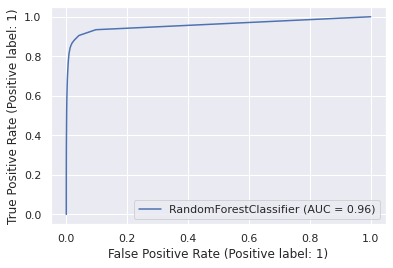

In [128]:
metrics.plot_roc_curve(rf_unsampled, X_test, y_test)

> #### Metrics for Random Forest - Unsampled: 
- Recall on Train: 0.22
- Recall on Test: 0.18
- Area Under the Curve: 0.96

In [129]:
# Correlation ??
# Multicolinearity

# 3.2 Random Forest - SMOTE

In [130]:
rf_smote = RandomForestClassifier(random_state=42).fit(X_train_smote, y_train_smote)

In [131]:
params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_8 = GridSearchCV(estimator=rf_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [132]:
%%time
grid_search_8.fit(X_train_smote, y_train_smote)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 58.1 s, sys: 1.99 s, total: 1min
Wall time: 35min 22s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [133]:
rf_smote = grid_search_8.best_estimator_
evaluate_model_smote(rf_smote)

Train set performance:
0.8261454145666925
[[926885  39992]
 [168096 798781]]
-------------------------
Test set performance:
0.7826318593500267
[[308960  13332]
 [   408   1469]]


In [134]:
grid_search_8.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 50,
 'n_estimators': 10}

#### ROC Curve

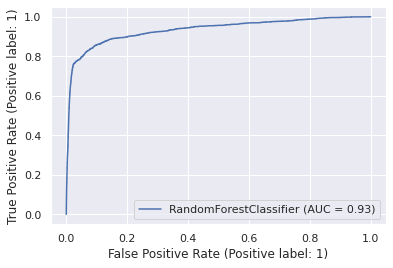

In [135]:
metrics.plot_roc_curve(rf_smote, X_test, y_test)

> #### Metrics for Random Forest - SMOTE: 
- Recall on Train: 0.82
- Recall on Test: 0.78
- Area Under the Curve: 0.94

# 3.3 Random Forest - ADASYN

In [136]:
rf_adasyn = RandomForestClassifier(random_state=42).fit(X_train_adasyn, y_train_adasyn)

In [137]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the n_estimators:

params = {
    'max_depth': [7,10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [10,15,30]
}

grid_search_9 = GridSearchCV(estimator=rf_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [138]:
%%time
grid_search_9.fit(X_train_adasyn, y_train_adasyn)

Fitting 5 folds for each of 12 candidates, totalling 60 fits
CPU times: user 1min 13s, sys: 2 s, total: 1min 15s
Wall time: 33min 11s


GridSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini'], 'max_depth': [7, 10],
                         'min_samples_leaf': [50, 80],
                         'n_estimators': [10, 15, 30]},
             scoring='recall', verbose=1)

In [139]:
grid_search_9.best_score_

0.815202441564732

In [140]:
rf_adasyn = grid_search_9.best_estimator_
evaluate_model_adasyn(rf_adasyn)

Train set performance:
0.8215790065519415
[[919080  47797]
 [172949 796382]]
-------------------------
Test set performance:
0.795418220564731
[[306285  16007]
 [   384   1493]]


In [141]:
grid_search_9.best_params_

{'criterion': 'gini',
 'max_depth': 10,
 'min_samples_leaf': 80,
 'n_estimators': 15}

#### ROC Curve

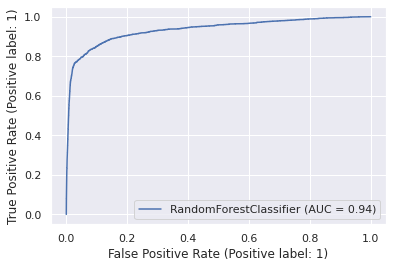

In [142]:
metrics.plot_roc_curve(rf_adasyn, X_test, y_test)

> #### Metrics for Random Forest - ADASYN: 
- Recall on Train: 0.81
- Recall on Test: 0.79
- Area Under the Curve: 0.93

-----

# 4.1 XGBoost - Unsampled

In [143]:
from xgboost import XGBClassifier

In [144]:
xgb_unsampled = XGBClassifier().fit(X_train, y_train)

In [145]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1,0.3,0.5]
}

grid_search_10 = GridSearchCV(estimator=xgb_unsampled,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [ ]:
%%time
grid_search_10.fit(X_train, y_train)

Fitting 5 folds for each of 12 candidates, totalling 60 fits


In [ ]:
xgb_best_unsampled = grid_search_10.best_estimator_
evaluate_model_unsampled(xgb_best_unsampled)

In [ ]:
grid_search_10.best_params_

#### ROC Curve

In [ ]:
metrics.plot_roc_curve(xgb_unsampled, X_test, y_test)

> #### Metrics for XGBoost - Unsampled: 
- Recall on Train: 0.67
- Recall on Test: 0.47
- Area Under the Curve: 0.98

# 4.2 XGBoost - SMOTE

In [ ]:
xgb_smote = XGBClassifier().fit(X_train_smote, y_train_smote)

In [ ]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_11 = GridSearchCV(estimator=xgb_smote,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [ ]:
%%time
grid_search_11.fit(X_train_smote, y_train_smote)

In [ ]:
xgb_best_smote = grid_search_11.best_estimator_
evaluate_model_smote(xgb_best_smote)

In [ ]:
grid_search_11.best_params_

#### ROC Curve

In [ ]:
metrics.plot_roc_curve(xgb_smote, X_test, y_test)

> #### Metrics for XGBoost - SMOTE: 
- Recall on Train: 0.87
- Recall on Test: 0.80
- Area Under the Curve: 0.95

# 4.3 XGBoost - ADASYN

In [ ]:
xgb_adasyn = XGBClassifier().fit(X_train_adasyn, y_train_adasyn)

In [ ]:
# Applying same parameters as the ones finalised in Decision Trees and building up on the learning_rate:

params = {
    'max_depth': [10],
    'min_samples_leaf': [50,80],
    'criterion': ['gini'],
    'n_estimators': [15,30],
    'learning_rate': [0.1]
}

grid_search_12 = GridSearchCV(estimator=xgb_adasyn,
                    param_grid=params,
                    cv=5,
                    n_jobs=-1, verbose=1,
                    scoring='recall')

In [ ]:
%%time
grid_search_12.fit(X_train_adasyn, y_train_adasyn)

In [ ]:
xgb_best_adasyn = grid_search_12.best_estimator_
evaluate_model_adasyn(xgb_best_adasyn)

In [ ]:
grid_search_12.best_params_

#### ROC Curve

In [ ]:
metrics.plot_roc_curve(xgb_adasyn, X_test, y_test)

> #### Metrics for Random Forest - SMOTE: 
- Recall on Train: 0.86
- Recall on Test: 0.80
- Area Under the Curve: 0.95

# `Testing the results on the unseen Test Data:`

In [ ]:
# Reading the test dataset

df_test = pd.read_csv('/content/gdrive/MyDrive/Credit Card Fraud Detection Dataset/fraudTest.csv')
df_test.head()

In [ ]:
# Considering only the relevant columns/features in a new dataframe

fraudTest = df_test[['trans_date_trans_time','amt','gender','lat','long','city_pop','dob','merch_lat','merch_long','is_fraud']]
fraudTest.head()

In [ ]:
fraud_train.head()

In [ ]:
# Converting columns to datetime for fraudTest

fraudTest.dob = pd.to_datetime(fraudTest['dob'])
fraudTest.trans_date_trans_time = pd.to_datetime(fraudTest['trans_date_trans_time'])

In [ ]:
# Creating a new column called transaction date and converting into datetime

fraudTest['Transaction_Date'] = pd.to_datetime(fraudTest['trans_date_trans_time'], format='%Y:%M:%D').dt.date
fraudTest.Transaction_Date = pd.to_datetime(fraudTest['Transaction_Date'])

In [ ]:
# Creating a new column called transaction time

fraudTest['Transaction_Time'] = pd.to_datetime(fraudTest['trans_date_trans_time'], format='%Y:%M:%D').dt.time

In [ ]:
# Creating a new column called Age

fraudTest['Age'] = round((fraudTest['Transaction_Date'] - fraudTest['dob'])/np.timedelta64(1, 'Y'))
fraudTest.Age = fraudTest.Age.astype('int')

In [ ]:
fraudTest.info()

In [ ]:
# Calling the function created earlier to calculate the Day of the Week 

fraudTest['Day_of_Week'] = fraudTest['Transaction_Date'].apply(DoW)

In [ ]:
# Creating a new column Month

fraudTest['Month'] = pd.DatetimeIndex(fraudTest.trans_date_trans_time).month

# Making Gender column binary

fraudTest['gender'] = fraudTest['gender'].map({'F':1, 'M':0})

# Ensuring Day of Week is represented numerically
fraudTest['Day_of_Week'] = fraudTest['Day_of_Week'].map({'Monday':1, 'Tuesday':2, 'Wednesday': 3, 'Thursday': 4,
                                                          'Friday':5, 'Saturday':6, 'Sunday': 7})

In [ ]:
# Calling the function created earlier to calculate the Distance between the customer's home location and
# the location of transactions (fraudulent or otherwise)

Dist2 = []
for a,b,c,d in zip(fraudTest['lat'], fraudTest['long'], fraudTest['merch_lat'], fraudTest['merch_long']):
    Dist2.append(haversineDistance(a,b,c,d))

In [ ]:
# Adding the calculated Distance column in the test dataframe

fraudTest['Dist'] = Dist2
fraudTest.head()

In [ ]:
# Dropping unnecessary columns

fraudTest.drop(['trans_date_trans_time','Transaction_Date','Transaction_Time','dob', 
                 'lat','long', 'merch_lat','merch_long'], axis=1, inplace=True)
fraudTest.head()

In [ ]:
fraudTest['amt'] = np.log(fraudTest['amt'])
fraudTest['city_pop'] = np.log(fraudTest['city_pop'])

## `Model Selection and Model Building`
> Based on the Recall scores, AUC Scores, and Confusion Matrices collected from the 12 algorithms (4 algorithms - unsampled and sampled), following is the summary of all values to help us pick the best model of all:

In [ ]:
summary_dict = {
    'Model': ['Logistic Regression - Unsampled', 'Logistic Regression - SMOTE', 'Logistic Regression - ADASYN',
             'Decision Trees - Unsampled', 'Decision Trees - SMOTE', 'Decision Trees - ADASYN',
             'Random Forest - Unsampled', 'Random Forest - SMOTE', 'Random Forest - ADASYN',
             'XGBoost - Unsampled', 'XGBoost - SMOTE', 'XGBoost - ADASYN'],
    'Recall on Train' : [0.0,0.77,0.73,0.30,0.85,0.85,0.22,0.82,0.81,0.67,0.87,0.86],
    'Recall on Test' : [0.99,1.0,1.0,0.28,0.82,0.82,0.18,0.78,0.79,0.47,0.80,0.80],
    'AUC Score' : [0.52,0.56,0.60,0.73,0.93,0.93,0.96,0.94,0.93,0.98,0.95,0.95]
}

summary_df = pd.DataFrame(summary_dict)
summary_df

In [ ]:
summary_df.sort_values('AUC Score', ascending = False)

### Based on the AUC Scores & Recall on Train and Test, checking the final test dataset

In [ ]:
# Splitting the test data into X and y:

y_final = fraudTest.pop('is_fraud')
X_final = fraudTest

### Testing the unseen data by using XGBoost - ADASYN Modelled Predictors:

In [ ]:
y_pred_xgb = xgb_best_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_xgb))
print(confusion_matrix(y_final, y_pred_xgb))

`XGBoost - ADASYN has a 74.5% recall score`

### Testing the unseen data by using XGBoost - SMOTE Modelled Predictors:

In [ ]:
y_pred_xgb_ = xgb_best_smote.predict(X_final)
print(recall_score(y_final, y_pred_xgb_))
print(confusion_matrix(y_final, y_pred_xgb_))

`XGBoost - SMOTE has a 74% recall score`

### Testing the unseen data by using Decision Tree - SMOTE Modelled Predictors:

In [ ]:
y_pred_final_dt = dt_smote.predict(X_final)
print(recall_score(y_final, y_pred_final_dt))
print(confusion_matrix(y_final, y_pred_final_dt))

`Decision Tree - SMOTE has a 76.7% recall score`

### Testing the unseen data by using Decision Tree - ADASYN Modelled Predictors:

In [ ]:
y_pred_final_dt_ = dt_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_final_dt_))
print(confusion_matrix(y_final, y_pred_final_dt_))

`Decision Tree - ADASYN has a 77.2% recall score`

### Testing the unseen data by using Random Forest - SMOTE Modelled Predictors:

In [ ]:
y_pred_final_rf = rf_smote.predict(X_final)
print(recall_score(y_final, y_pred_final_rf))
print(confusion_matrix(y_final, y_pred_final_rf))

`Random Forest - SMOTE has a 75% recall score`

### Testing the unseen data by using Random Forest - ADASYN Modelled Predictors:

In [ ]:
y_pred_final_rf_ = rf_adasyn.predict(X_final)
print(recall_score(y_final, y_pred_final_rf_))
print(confusion_matrix(y_final, y_pred_final_rf_))

`Random Forest - ADASYN has a 74.8% recall score`

------

> Choosing best model based on sensitivity

In [ ]:
# Let us check the confusion matrix for this test data:

cnf = confusion_matrix(y_final, y_pred_final_dt_)
cnf

In [ ]:
# Creating a dataframe to compare the actual v/s predicted values of y:

y_pred_final_dt_ = pd.Series(y_pred_final_dt_)
df_pred = pd.concat([X_final, y_final,y_pred_final_dt_], axis = 1)
df_pred.rename(columns = {0:'y_pred'}, inplace = True)
df_pred.head()

In [ ]:
# Extracting only the fraudulent transactions from this test dataset:

fraud_df = df_pred[df_pred.is_fraud==1]
fraud_df.head()

### Let's check the AUC on the final test data

In [ ]:
metrics.plot_roc_curve(dt_adasyn, X_final, y_final)

`Area Under the Curve is 0.91`

-----

> # `Cost Benefit Analysis`
- The Cost Benefit Analysis is to be done on the original data
- Merging the train and test data to make an original dataframe

In [ ]:
# Let us merge the dataset to form the original

fraud = pd.concat([df, df_test], axis=0)
fraud.head()

#### Let us take a look at what we need to do in order to perform the cost-benefit analysis step by step:
- ### Part I: Analyse the dataset and find the following figures:

> 1. Average number of transactions per month 
> 2. Average number of fraudulent transactions per month
> 3. Average amount per fraudulent transaction 

In [ ]:
# Since the given (original) dataset is from Jan 1 2019 to Dec 31 2020, the data is of 24 months
# Total transactions can be found by checking the shape of the original dataframe
# Avg transactions per month would be to divide that shape/total by 24 (months)

avg_transactions_pm = fraud.shape[0]//24

In [ ]:
print("1. Average number of transactions per month are:", avg_transactions_pm)

In [ ]:
# Checking only for fraudulent transactions:

fraud[fraud.is_fraud == 1]

In [ ]:
# Fraudulent transactions are 9651 (number of rows) that are spread across 24 months
# Avg fraudulent transactions per month would be to divide the shape/total fraudulent rows by 24 (months)

avg_fraudtrans_pm = fraud[fraud.is_fraud == 1].shape[0]//24

In [ ]:
print("2. Average number of fraudulent transactions per month are:", avg_fraudtrans_pm)

In [ ]:
# Average amount of fraud is the total fraudulent amount divided by the total number of fraudulent transactions

avg_fraud_amt = fraud[fraud.is_fraud == 1].amt.sum()//fraud[fraud.is_fraud == 1].shape[0]

In [ ]:
print("3. Average amount per fraudulent transactions is:", avg_fraud_amt)

- ### Part II: Compare the cost incurred per month by the bank before and after the model deployment:

1. Cost incurred per month before the model was deployed = Average amount per fraudulent transaction * Average number of fraudulent transactions per month
2. Cost incurred per month after the model is built and deployed: (Use the test metric from the model evaluation part and the calculations performed in Part I to compute the values given below)
 

- Let TF be the average number of transactions per month detected as fraudulent by the model and let the cost of providing customer executive support per fraudulent transaction detected by the model = USD 1.5

- Total cost of providing customer support per month for fraudulent transactions detected by the model = 1.5 * TF.
- Let FN be the average number of transactions per month that are fraudulent but not detected by the model 

- Cost incurred due to these fraudulent transactions left undetected by the model = Average amount per fraudulent transaction * FN
- Therefore, the cost incurred per month after the model is built and deployed = 1.5 * TF + Average amount per fraudulent transaction * FN
- Final savings = Cost incurred before - Cost incurred after

In [ ]:
# Calculating the cost incurred before deploying the model based on the first point descibed above:

cost_before_model = avg_fraud_amt*avg_fraudtrans_pm
cost_before_model

In [ ]:
# Let TF be the average number of transactions per month detected as fraudulent by the model 
# Since the test dataframe has 7 months data, dividing by 7

TF = fraud_df.y_pred.sum()//7
print("Total cost of providing customer support per month for fraudulent transactions detected by the model =", TF*1.5)

In [ ]:
# Let FN be the average number of transactions per month that are fraudulent but not detected by the model
# Since the test dataframe has 7 months data, dividing by 7

FN = fraud_df[fraud_df.y_pred==0].is_fraud.sum()//7
print("Cost incurred due to these fraudulent transactions left undetected by the model =", FN*avg_fraud_amt)

In [ ]:
# Cost incurred after the model is deployed:

cost_after_model = (TF*1.5) + (FN*avg_fraud_amt)
cost_after_model

In [ ]:
# Final savings = Cost incurred before - Cost incurred after

Final_Savings = int(cost_before_model - cost_after_model)
print("Final Savings after deploying the model are: $",Final_Savings)